In [1]:
dir = "../../data/algoseek/daily-trades-2007-2024"

In [2]:
import os
import pandas as pd

def load_all_csvs_from_folder(folder_path):
    """
    Loads all CSV files from a given folder into a single pandas DataFrame.

    Parameters:
        folder_path (str): The path to the folder containing CSV files.

    Returns:
        pandas.DataFrame: Concatenated DataFrame containing all CSV data.
    """
    # List all files ending with .csv in the folder
    csv_files = [f for f in os.listdir(folder_path) if f.endswith('.csv')]
    dataframes = []
    for file in csv_files:
        file_path = os.path.join(folder_path, file)
        df = pd.read_csv(file_path)
        dataframes.append(df)
    # Concatenate all DataFrames
    if dataframes:
        combined_df = pd.concat(dataframes, ignore_index=True)
    else:
        combined_df = pd.DataFrame()  # Empty DataFrame if no CSVs found
    return combined_df

# Example usage:
# folder = 'path/to/your/folder'
# df = load_all_csvs_from_folder(folder)
# print(df)

In [3]:
import time
start_time = time.time()

df = load_all_csvs_from_folder(dir)

end_time = time.time()
print(f"Elapsed time: {end_time - start_time:.2f} seconds")

Elapsed time: 103.47 seconds


In [4]:
print(len(df["Ticker"].unique()))
print(df.shape)

27891
(38366685, 12)


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38366685 entries, 0 to 38366684
Data columns (total 12 columns):
 #   Column          Dtype  
---  ------          -----  
 0   Date            int64  
 1   Ticker          object 
 2   Open            float64
 3   High            float64
 4   Low             float64
 5   Close           float64
 6   Volume          int64  
 7   OpenAdjusted    float64
 8   HighAdjusted    float64
 9   LowAdjusted     float64
 10  CloseAdjusted   float64
 11  VolumeAdjusted  int64  
dtypes: float64(8), int64(3), object(1)
memory usage: 3.4+ GB


In [6]:
# import the *.jsonl objects from the directory
import glob
import json
import pandas as pd

dir = "extracted_data_all/"
files = glob.glob(dir + "*.jsonl")
dfs = []
for file in files:
    df_ = pd.read_json(file, lines=True)
    dfs.append(df_)
df_sentiment = pd.concat(dfs)
print(df_sentiment.shape)
df_sentiment.head()

(156510, 5)


,ticker,date,polarity_diluted,polarity_pure,polarity_immediate
0,BRKR,2014-01-14,0.543970,0.951947,1
1,LQDT,2014-01-14,0.083070,0.996844,1
2,ENPH,2014-01-14,0.329327,0.688592,1
3,ICLR,2014-01-14,0.271633,0.995988,0
4,PLNR,2014-01-14,0.436669,0.960672,1


In [7]:
symbols = df_sentiment["ticker"].unique()
print(len(symbols))

16152


In [8]:
common = list(set(df["Ticker"].unique()) & set(df_sentiment["ticker"].unique()))
print(len(common))

11031


In [9]:
# Assuming df is your DataFrame and ticker_list is your list of tickers
df = df[df['Ticker'].isin(common)]
print(df.info())

<class 'pandas.core.frame.DataFrame'>
Index: 24301673 entries, 1171 to 38363178
Data columns (total 12 columns):
 #   Column          Dtype  
---  ------          -----  
 0   Date            int64  
 1   Ticker          object 
 2   Open            float64
 3   High            float64
 4   Low             float64
 5   Close           float64
 6   Volume          int64  
 7   OpenAdjusted    float64
 8   HighAdjusted    float64
 9   LowAdjusted     float64
 10  CloseAdjusted   float64
 11  VolumeAdjusted  int64  
dtypes: float64(8), int64(3), object(1)
memory usage: 2.4+ GB
None


In [10]:
df['Date'] = pd.to_datetime(df['Date'], format='%Y%m%d')
print(df.info(), "\n")
print(df.head())

<class 'pandas.core.frame.DataFrame'>
Index: 24301673 entries, 1171 to 38363178
Data columns (total 12 columns):
 #   Column          Dtype         
---  ------          -----         
 0   Date            datetime64[ns]
 1   Ticker          object        
 2   Open            float64       
 3   High            float64       
 4   Low             float64       
 5   Close           float64       
 6   Volume          int64         
 7   OpenAdjusted    float64       
 8   HighAdjusted    float64       
 9   LowAdjusted     float64       
 10  CloseAdjusted   float64       
 11  VolumeAdjusted  int64         
dtypes: datetime64[ns](1), float64(8), int64(2), object(1)
memory usage: 2.4+ GB
None 

           Date Ticker   Open   High    Low  Close  Volume  OpenAdjusted  \
1171 2024-01-02   NECB  17.56  17.81  17.44  17.77   46291       17.1368   
1172 2024-01-03   NECB  17.84  17.85  17.50  17.54   55395       17.4101   
1173 2024-01-04   NECB  17.61  17.69  17.38  17.41   47765       17

# Feature Engineering

## Future & Past Return Indicators for Stock Prediction

To enhance our predictive models, this section systematically augments the dataset with a comprehensive set of return-based features for each stock. These engineered features provide crucial signals about both **future** and **past** market behavior, helping models learn patterns not just from historical data, but also from how prices and volatility are expected to evolve.

### What This Code Does

1. **Return Features:**  
   - Calculates both logarithmic and compounded returns for 1-day, 1-week, and 1-month horizons.
   - Adds both future-looking returns (e.g., "what will the return be in 5 days?") and past-looking returns (e.g., "what was the return over the last 5 days?").

2. **Volatility, Momentum, Drawdown, and Max Gain:**  
   - Quantifies expected and realized price volatility, momentum (average return), drawdown (max loss), and max gain for both future and past periods.
   - These metrics are vital for capturing risk and trend information.

3. **Directionality:**  
   - Adds binary indicators for whether price moved up or down over each horizon, for both the future (supervised labels) and the past (features).

4. **Per-Ticker Grouping:**  
   - Applies all calculations separately for each stock, preserving time order, ensuring accurate rolling window metrics.
   - Concatenates all processed data for downstream modeling.

### Why These Features Matter

- **Future features** like returns, volatility, and direction serve as targets for supervised learning models.
- **Past features** are input signals for the model, capturing historical context and patterns that might inform future movements.
- Rolling windows (weekly/monthly) help the model recognize persistent trends and cycles.
- By engineering both cumulative (total change) and compounded (growth rate) metrics, the dataset becomes rich enough to support regression, classification, and even risk modeling tasks.

### How to Use

After running this cell, your dataframe (`df_features`) will contain, for each date and ticker:
- Past and future return metrics
- Volatility and momentum indicators
- Drawdown and max gain signals
- Binary price direction targets

This expanded feature set sets the stage for robust machine learning experiments, allowing you to investigate which signals best predict stock price movements.

In [13]:
import time
start_time = time.time()

import numpy as np
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

def add_return_features(df):
    # --- Your features ---
    df['future_1D_Return_log'] = np.log1p(df['CloseAdjusted'].pct_change(periods=-1) * -1)
    df['future_1W_Return_CUML_log'] = np.log1p(df['CloseAdjusted'].pct_change(periods=-5) * -1)
    df['future_1M_Return_CUML_log'] = np.log1p(df['CloseAdjusted'].pct_change(periods=-20) * -1)
    df['future_1W_Return_COMP_log'] = np.log1p((1 + df['future_1D_Return_log']).rolling(window=5).apply(np.prod, raw=True).shift(-5) - 1)
    df['future_1M_Return_COMP_log'] = np.log1p((1 + df['future_1D_Return_log']).rolling(window=20).apply(np.prod, raw=True).shift(-20) - 1)

    # --- Past returns ---
    df['past_1D_Return_log'] = np.log1p(df['CloseAdjusted'].pct_change(periods=1))
    df['past_1W_Return_CUML_log'] = np.log1p(df['CloseAdjusted'].pct_change(periods=5))
    df['past_1M_Return_CUML_log'] = np.log1p(df['CloseAdjusted'].pct_change(periods=20))
    df['past_1W_Return_COMP_log'] = np.log1p((1 + df['past_1D_Return_log']).rolling(window=5).apply(np.prod, raw=True) - 1)
    df['past_1M_Return_COMP_log'] = np.log1p((1 + df['past_1D_Return_log']).rolling(window=20).apply(np.prod, raw=True) - 1)

    # =============================
    # --- Additional future indicators ---
    # =============================

    # Future volatility (realized volatility over next period)
    df['future_1W_volatility'] = df['CloseAdjusted'].pct_change(periods=-1).rolling(window=5).std().shift(-5)
    df['future_1M_volatility'] = df['CloseAdjusted'].pct_change(periods=-1).rolling(window=20).std().shift(-20)

    # Future momentum (mean return over window)
    df['future_1W_momentum'] = df['CloseAdjusted'].pct_change(periods=-1).rolling(window=5).mean().shift(-5)
    df['future_1M_momentum'] = df['CloseAdjusted'].pct_change(periods=-1).rolling(window=20).mean().shift(-20)

    # Future drawdown (max loss in next period)
    df['future_1W_drawdown'] = (df['CloseAdjusted'].shift(-5) - df['CloseAdjusted']) / df['CloseAdjusted']
    df['future_1M_drawdown'] = (df['CloseAdjusted'].shift(-20) - df['CloseAdjusted']) / df['CloseAdjusted']

    # Future max gain (max gain in next period)
    df['future_1W_max_gain'] = (df['CloseAdjusted'].rolling(window=5).max().shift(-5) - df['CloseAdjusted']) / df['CloseAdjusted']
    df['future_1M_max_gain'] = (df['CloseAdjusted'].rolling(window=20).max().shift(-20) - df['CloseAdjusted']) / df['CloseAdjusted']

    # Future price direction (binary up/down for each horizon)
    df['future_1D_direction'] = (df['future_1D_Return_log'] > 0).astype(int)
    df['future_1W_direction'] = (df['future_1W_Return_CUML_log'] > 0).astype(int)
    df['future_1M_direction'] = (df['future_1M_Return_CUML_log'] > 0).astype(int)

    # =============================
    # --- Additional past indicators (NEW) ---
    # =============================

    # Past volatility (realized volatility over previous period)
    df['past_1W_volatility'] = df['CloseAdjusted'].pct_change(periods=1).rolling(window=5).std()
    df['past_1M_volatility'] = df['CloseAdjusted'].pct_change(periods=1).rolling(window=20).std()

    # Past momentum (mean return over previous window)
    df['past_1W_momentum'] = df['CloseAdjusted'].pct_change(periods=1).rolling(window=5).mean()
    df['past_1M_momentum'] = df['CloseAdjusted'].pct_change(periods=1).rolling(window=20).mean()

    # Past drawdown (max loss in previous period)
    df['past_1W_drawdown'] = (df['CloseAdjusted'] - df['CloseAdjusted'].rolling(window=5).min()) / df['CloseAdjusted']
    df['past_1M_drawdown'] = (df['CloseAdjusted'] - df['CloseAdjusted'].rolling(window=20).min()) / df['CloseAdjusted']

    # Past max gain (max gain in previous period)
    df['past_1W_max_gain'] = (df['CloseAdjusted'].rolling(window=5).max() - df['CloseAdjusted']) / df['CloseAdjusted']
    df['past_1M_max_gain'] = (df['CloseAdjusted'].rolling(window=20).max() - df['CloseAdjusted']) / df['CloseAdjusted']

    # Past price direction (binary up/down for each horizon)
    df['past_1D_direction'] = (df['past_1D_Return_log'] > 0).astype(int)
    df['past_1W_direction'] = (df['past_1W_Return_CUML_log'] > 0).astype(int)
    df['past_1M_direction'] = (df['past_1M_Return_CUML_log'] > 0).astype(int)

    return df

# List to hold processed DataFrames
dfs = []

prev_first_letter = None

for ticker, group in df.groupby('Ticker'):
    first_letter = ticker[0]
    if first_letter != prev_first_letter:
        print(f"Processing tickers starting with '{first_letter}'...")
        prev_first_letter = first_letter
    group = group.sort_values(by='Date')
    group_processed = add_return_features(group.copy())
    dfs.append(group_processed)
# Concatenate all processed groups
df_features = pd.concat(dfs, ignore_index=True)

end_time = time.time()
print(f"Elapsed time: {end_time - start_time:.2f} seconds")

Processing tickers starting with 'A'...
Processing tickers starting with 'B'...
Processing tickers starting with 'C'...
Processing tickers starting with 'D'...
Processing tickers starting with 'E'...
Processing tickers starting with 'F'...
Processing tickers starting with 'G'...
Processing tickers starting with 'H'...
Processing tickers starting with 'I'...
Processing tickers starting with 'J'...
Processing tickers starting with 'K'...
Processing tickers starting with 'L'...
Processing tickers starting with 'M'...
Processing tickers starting with 'N'...
Processing tickers starting with 'O'...
Processing tickers starting with 'P'...
Processing tickers starting with 'Q'...
Processing tickers starting with 'R'...
Processing tickers starting with 'S'...
Processing tickers starting with 'T'...
Processing tickers starting with 'U'...
Processing tickers starting with 'V'...
Processing tickers starting with 'W'...
Processing tickers starting with 'X'...
Processing tickers starting with 'Y'...


In [14]:
print(df_features.shape)
df_features.replace([np.inf, -np.inf], np.nan, inplace=True)
# now drop the rows with nan values
df_features.dropna(inplace=True)
print(df_features.shape)

(24301673, 44)
(23652637, 44)


## Explanation of Sentiment Metrics: Diluted, Pure, and Immediate

The imported sentiment dataset offers three distinct polarity scores for each press release and company, each capturing a different facet of textual sentiment:

- **Polarity_diluted**  
  This metric "dilutes" the overall sentiment by spreading the polarity across all sentences in the press release, including neutral and off-topic sentences. If a release is long or contains many neutral statements, the diluted score will tend toward zero, even if some sentences are strongly positive or negative. This measure helps capture the overall tone with respect to the amount of content.

- **Polarity_pure**  
  The pure score focuses only on "polar" sentences — those that are clearly positive or negative — and ignores neutral sentences entirely. It averages the sentiment of these polarized sentences, providing a more focused and potentially more volatile signal that highlights strong opinions or reactions, without being diluted by neutral context.

- **Polarity_immediate**  
  This metric is the most targeted: it averages the sentiment of only those sentences where the company (`Ticker`) is explicitly mentioned. This score reflects sentiment that is specifically and directly attributed to the company, making it particularly relevant for short-term prediction or event-driven analysis.

Together, these metrics allow for nuanced sentiment analysis:
- **Diluted** captures broad tone and context,
- **Pure** highlights strong opinions,
- **Immediate** isolates direct mentions and impacts.
By analyzing all three, you can better model how news and press releases may influence stock behavior for each company.

In [15]:
# Change column names to have uppercase first character
df_sentiment.columns = [col.capitalize() for col in df_sentiment.columns]

df_sentiment = df_sentiment.groupby(['Date', 'Ticker'])[['Polarity_diluted', 'Polarity_pure', 'Polarity_immediate']].mean().reset_index()
print(df_sentiment.info())
print(df_sentiment.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 135601 entries, 0 to 135600
Data columns (total 5 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   Date                135601 non-null  datetime64[ns]
 1   Ticker              135601 non-null  object        
 2   Polarity_diluted    135601 non-null  float64       
 3   Polarity_pure       135601 non-null  float64       
 4   Polarity_immediate  135601 non-null  float64       
dtypes: datetime64[ns](1), float64(3), object(1)
memory usage: 5.2+ MB
None
        Date Ticker  Polarity_diluted  Polarity_pure  Polarity_immediate
0 1987-03-26    CRR          0.000000       0.000000                 0.0
1 1997-03-18   FMAC          0.199587       0.997936                 0.0
2 2000-06-05     MS         -0.392117      -0.784233                -1.0
3 2000-11-21    JOB          0.144141       0.257937                 0.0
4 2002-02-12   CMGI          0.047688       0.3338

We merge the datasets containing `features` and `polarities`, which reduces the size of the dataset where we have no column `NaN`.

In [16]:
df_features['Date'] = pd.to_datetime(df_features['Date'], format='%Y%m%d')

df_merged = (pd.merge(
        df_features,
        df_sentiment,
        on=['Date', 'Ticker'],
        how='inner' # Keeps only the rows where `Date` exists in both
    )
    .sort_values(by='Date')
    .drop(columns=['Ticker']))

# Display the head of the merged dataframe
print(df_merged.head(), "\n")
print(df_merged.info())

            Date   Open   High    Low  Close  Volume  OpenAdjusted  \
42399 2008-01-02  56.07  56.15  55.07  55.48  300700       14.1941   
67249 2008-01-02  34.83  34.89  33.90  34.65  562730       21.7988   
43347 2008-01-02   5.78   5.92   5.67   5.69   42148        5.7800   
94912 2008-01-02   8.64   8.64   7.81   8.52  223300        1.0800   
78729 2008-01-02  83.84  83.86  82.63  82.99  200400       34.4325   

       HighAdjusted  LowAdjusted  CloseAdjusted  ...  past_1W_drawdown  \
42399       14.2144      13.9410        14.0448  ...          0.000000   
67249       21.8364      21.2168        21.6862  ...          0.000000   
43347        5.9200       5.6700         5.6900  ...          0.063269   
94912        1.0800       0.9762         1.0650  ...          0.005822   
78729       34.4407      33.9356        34.0834  ...          0.002048   

       past_1M_drawdown  past_1W_max_gain  past_1M_max_gain  \
42399          0.040613          0.015678          0.015678   
67249   

Now we check the correlations between features, both past and future with sentiment scores, so that we observe the highly correlated features that need to be excluded from the model setup.

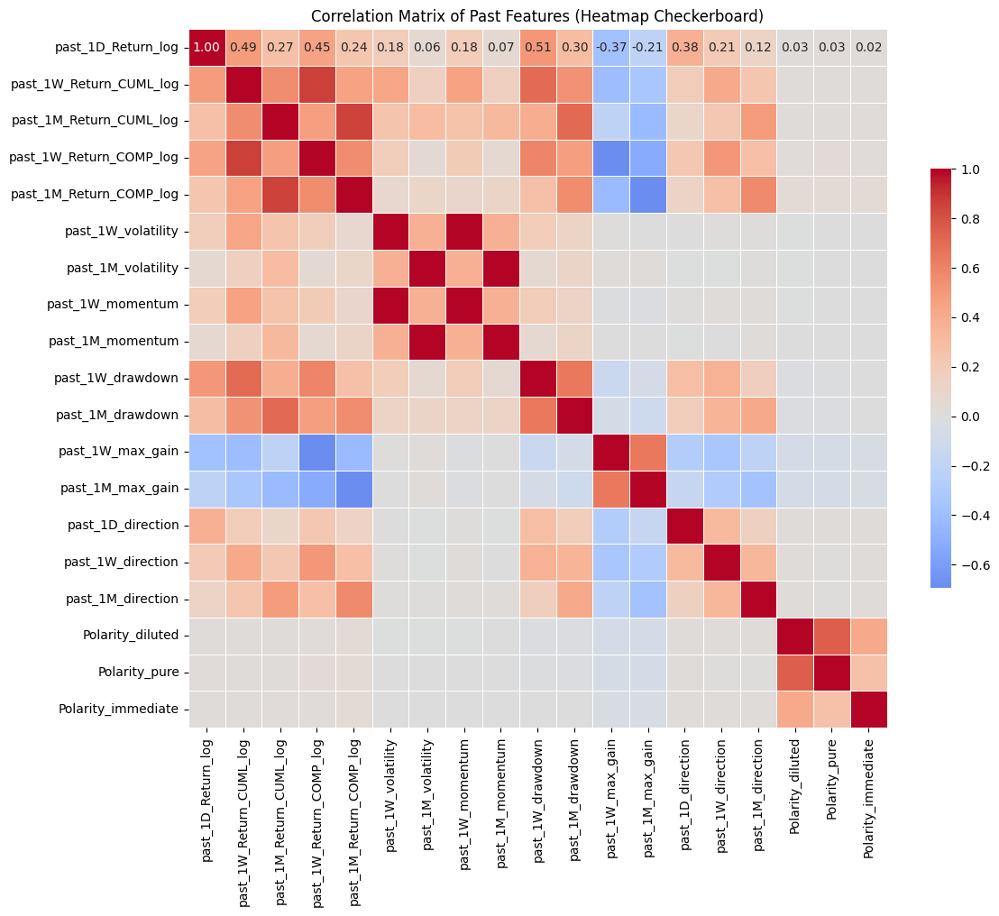

In [17]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming your DataFrame is df_merged and past_features are already defined
past_features = [col for col in df_merged.columns if col.startswith('past_') or 'Polarity' in col]
corr_matrix = df_merged[past_features].corr()

plt.figure(figsize=(12, 10))
sns.heatmap(
    corr_matrix,
    annot=True,             # Show numeric values
    fmt=".2f",              # Format for numbers
    cmap="coolwarm",        # Heatmap color scheme (blue=negative, red=positive)
    center=0,               # Center at zero correlation
    square=True,            # Checkerboard style
    linewidths=.5,          # Lines between squares
    cbar_kws={'shrink': .6} # Smaller colorbar
)
plt.title("Correlation Matrix of Past Features (Heatmap Checkerboard)")
plt.tight_layout()
plt.show()

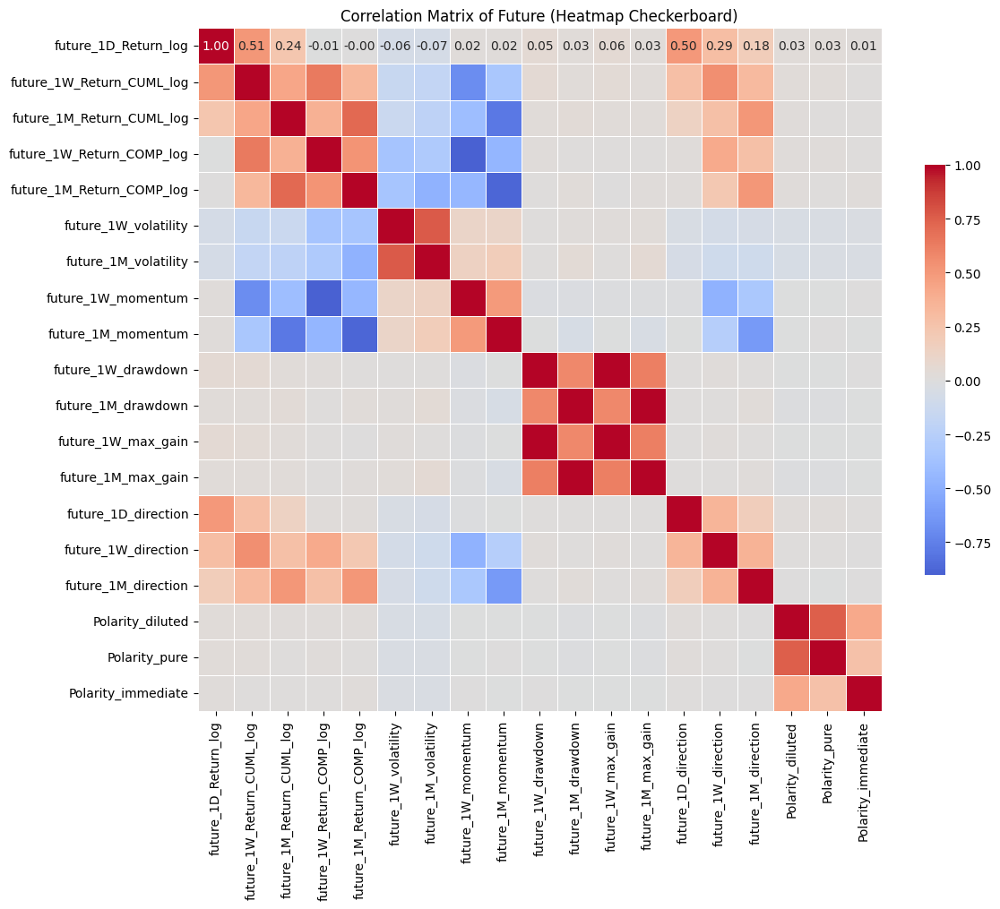

In [18]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming your DataFrame is df_merged and past_features are already defined
future_features = [col for col in df_merged.columns if col.startswith('future_') or 'Polarity' in col]
corr_matrix = df_merged[future_features].corr()

plt.figure(figsize=(12, 10))
sns.heatmap(
    corr_matrix,
    annot=True,             # Show numeric values
    fmt=".2f",              # Format for numbers
    cmap="coolwarm",        # Heatmap color scheme (blue=negative, red=positive)
    center=0,               # Center at zero correlation
    square=True,            # Checkerboard style
    linewidths=.5,          # Lines between squares
    cbar_kws={'shrink': .6} # Smaller colorbar
)
plt.title("Correlation Matrix of Future (Heatmap Checkerboard)")
plt.tight_layout()
plt.show()

Seeing that compound and cumulative returns are highly correlated, we exclude one of them from our set of features. We will simply ignore the compound returns.

`Polarity` columns seem to have no particular linear relationship between both `past` and `future` columns, which may indicate strong relevance in the prediction setup, or a complete noise, which we will question later.

## Pairwise Visualization of Feature Relationships

This code uses Seaborn’s `PairGrid` to create a matrix of plots that visually explore the relationships between key features in the dataset, including volume, past and future returns, volatility, drawdown, direction, and several sentiment scores.

- **Diagonal subplots:**  
  Show histograms of each feature, giving a sense of their distributions.

- **Off-diagonal subplots:**  
  Show scatter plots, revealing how two variables interact.

- **Color coding:**  
  - Red: Compares past and future features (e.g., past vs. future returns or volatility).
  - Purple: Involves sentiment features (`Polarity_diluted`, `Polarity_pure`, `Polarity_immediate`).
  - Blue: Other combinations.

By scanning this grid, you can quickly spot correlations, clusters, or outliers between pairs of features, and see how sentiment variables relate to market variables. This helps guide feature selection and model design for prediction tasks.

Now we create a new dataset with transforming the distributions to `Quantile-Distribution` so that we will see the empirical distribution of the features against each other.

In [19]:
from sklearn.preprocessing import QuantileTransformer

qt = QuantileTransformer(output_distribution='uniform')

# Example: Transforming polarity and return columns in your df
cols_to_transform = [
    col for col in df_merged.columns if df_merged[col].dtype in ['float64', 'int64']
]

df_transformed = df_merged.copy()
df_transformed[cols_to_transform] = qt.fit_transform(df_transformed[cols_to_transform])

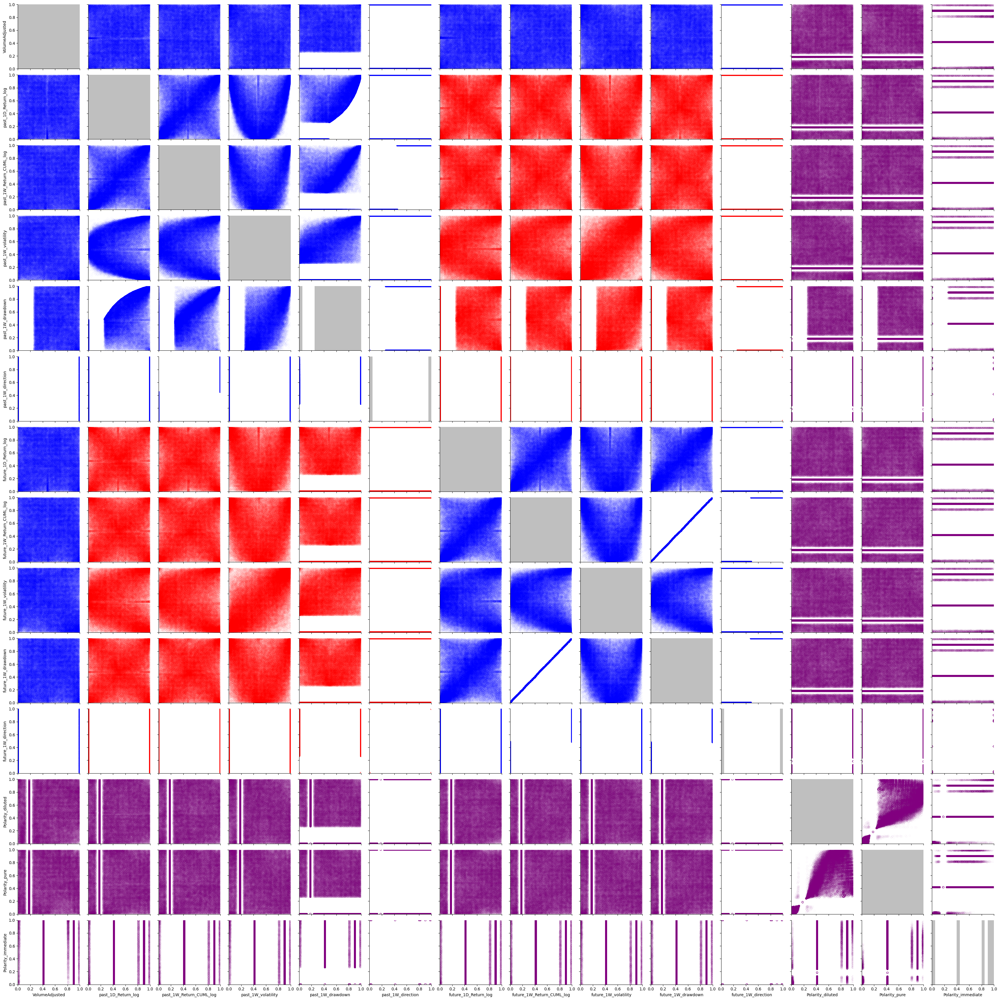

Elapsed time: 273.94 seconds


In [21]:
import time
start_time = time.time()

import seaborn as sns
import matplotlib.pyplot as plt

cols = [
    'VolumeAdjusted',
    'past_1D_Return_log',
    'past_1W_Return_CUML_log',
    'past_1W_volatility',
    'past_1W_drawdown',
    'past_1W_direction',
    'future_1D_Return_log',
    'future_1W_Return_CUML_log',
    'future_1W_volatility',
    'future_1W_drawdown',
    'future_1W_direction',
    'Polarity_diluted',
    'Polarity_pure',
    'Polarity_immediate'
]

def conditional_color(xvar, yvar):
    if ((xvar.startswith('past_') and yvar.startswith('future_')) or
        (xvar.startswith('future_') and yvar.startswith('past_'))):
        return 'red'
    elif ('Polarity' in xvar or 'Polarity' in yvar):
        return 'purple'
    else:
        return 'blue'

g = sns.PairGrid(df_transformed[cols], diag_sharey=False)

for i, xvar in enumerate(cols):
    for j, yvar in enumerate(cols):
        ax = g.axes[i, j]
        if i != j:
            color = conditional_color(xvar, yvar)
            ax.scatter(
                df_transformed[xvar],  # x-axis
                df_transformed[yvar],  # y-axis
                marker='o',
                facecolors='none',
                edgecolors=color,
                s=20,
                linewidths=0.1,
                alpha=0.25
            )
            ax.set_xlim(0, 1)
            ax.set_ylim(0, 1)
        else:
            ax.hist(df_transformed[xvar], bins=20, color="gray", alpha=0.5)
            ax.set_xlim(0, 1)
            ax.set_ylim(0, 1)

plt.show()

end_time = time.time()
print(f"Elapsed time: {end_time - start_time:.2f} seconds")

Even though `past` and `future` columns indicate some linear and nonlinear relations in a two-dimensional slice, both against each other and within their own group, *which is indicated by the different colors*, we see no particular linear relation between `polarity` features and the rest of the columns.

However, there could be nonlinear relations present, interacting with each other.

# Model Training

## Modeling Future Stock Returns and Volatility with LightGBM

This code trains predictive models for various future financial metrics—such as returns, volatility, and momentum—using both historical price features and sentiment data. For each target variable, it builds two models: one using only past price/volatility features, and one using both past features and sentiment features. Their performance is compared using RMSE (root mean squared error).

### Why LightGBM?

**LightGBM** is a fast, efficient gradient boosting framework designed for large datasets and high-dimensional features. It's particularly well-suited for our use case because:

- **Tabular, Heterogeneous Data:** Our dataset contains a mix of numerical financial indicators (returns, volatility) and sentiment scores. LightGBM handles continuous, categorical, and sparse features efficiently.
- **Nonlinear Relationships:** Financial markets are complex, and relationships between variables are rarely linear. LightGBM's tree-based approach can capture interactions between price history and sentiment that linear models would miss.
- **Speed and Scalability:** With tens of thousands of records and many features, model training needs to be fast and memory-efficient. LightGBM is optimized for this.
- **Robustness to Missing/Noisy Data:** Financial and sentiment data often have missing values or outliers. LightGBM includes built-in handling for this, making it practical for real-world financial datasets.

### Why This Modeling Approach?

- **Feature Sets:**  
  - *Past features* (e.g., prior returns, volatility, drawdown, direction) give context about recent market behavior.
  - *Sentiment features* (e.g., polarity scores) provide external information potentially predictive of future movement.
- **Targets:**  
  - The code predicts future returns (log, cumulative), volatility, and momentum over various horizons (1 day, 1 week, 1 month).
- **Comparison:**  
  - By training models with and without sentiment features, we can quantify the incremental value sentiment adds to traditional financial predictors.

### Workflow Summary

1. **Feature Selection:** Identify relevant columns for past market data and sentiment.
2. **Target Selection:** Define future metrics to predict.
3. **Model Training:** For each target, train two LightGBM regressors (one baseline, one with sentiment).
4. **Evaluation:** Calculate RMSE for both models to compare prediction accuracy.
5. **Interpretation:** Print and summarize results, guiding future feature engineering and model refinement.

This process provides a systematic way to evaluate how much sentiment data improves our forecasts of future market behavior, using a robust and scalable machine learning approach tailored to the dataset's structure.

In [22]:
!pip install lightgbm

In [24]:
import lightgbm as lgb
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# 1. Define your input features
past_features = [col for col in df_merged.columns if col.startswith('past_')]
sentiment_features = [col for col in df_merged.columns if 'Polarity' in col or 'sentiment' in col]
print(f"Past features: {past_features}")
print(f"Sentiment features: {sentiment_features}")
# You may adjust this to match your sentiment column patterns

# 2. Define your target columns
future_targets = [
    'future_1D_Return_log',
    'future_1W_Return_CUML_log',
    'future_1M_Return_CUML_log',
    'future_1W_volatility',
    'future_1M_volatility',
    'future_1W_momentum',
    'future_1M_momentum',
    # Add more future columns as needed
]

# Container for models and metrics
session_models = {}

for target_col in future_targets:
    # Base model: only non-sentiment features
    data_base = df_merged[past_features + [target_col]].dropna()
    X_base = data_base[past_features]
    y_base = data_base[target_col]
    X_train_base, X_test_base, y_train_base, y_test_base = train_test_split(
        X_base, y_base, test_size=0.1, random_state=42
    )
    model_base = lgb.LGBMRegressor(
        n_estimators=200,
        learning_rate=0.05,
        max_depth=6,
        random_state=42,
        verbose=-1
    )
    model_base.fit(X_train_base, y_train_base)
    y_pred_base = model_base.predict(X_test_base)
    rmse_base = np.sqrt(mean_squared_error(y_test_base, y_pred_base))

    # Sentiment-only model
    data_sent = df_merged[sentiment_features + [target_col]].dropna()
    X_sent = data_sent[sentiment_features]
    y_sent = data_sent[target_col]
    X_train_sent, X_test_sent, y_train_sent, y_test_sent = train_test_split(
        X_sent, y_sent, test_size=0.1, random_state=42
    )
    model_sent = lgb.LGBMRegressor(
        n_estimators=200,
        learning_rate=0.05,
        max_depth=6,
        random_state=42,
        verbose=-1
    )
    model_sent.fit(X_train_sent, y_train_sent)
    y_pred_sent = model_sent.predict(X_test_sent)
    rmse_sent = np.sqrt(mean_squared_error(y_test_sent, y_pred_sent))

    # Store both models and their metrics
    session_models[target_col] = {
        'base': {
            'model': model_base,
            'rmse': rmse_base
        },
        'sentiment-only': {
            'model': model_sent,
            'rmse': rmse_sent
        }
    }

    print(f"Target: {target_col} | RMSE base: {rmse_base:.4f} | RMSE sentiment-only: {rmse_sent:.4f}")

Past features: ['past_1D_Return_log', 'past_1W_Return_CUML_log', 'past_1M_Return_CUML_log', 'past_1W_Return_COMP_log', 'past_1M_Return_COMP_log', 'past_1W_volatility', 'past_1M_volatility', 'past_1W_momentum', 'past_1M_momentum', 'past_1W_drawdown', 'past_1M_drawdown', 'past_1W_max_gain', 'past_1M_max_gain', 'past_1D_direction', 'past_1W_direction', 'past_1M_direction']
Sentiment features: ['Polarity_diluted', 'Polarity_pure', 'Polarity_immediate']
Target: future_1D_Return_log | RMSE base: 0.0541 | RMSE sentiment-only: 0.0540
Target: future_1W_Return_CUML_log | RMSE base: 0.1096 | RMSE sentiment-only: 0.1112
Target: future_1M_Return_CUML_log | RMSE base: 0.2460 | RMSE sentiment-only: 0.2498
Target: future_1W_volatility | RMSE base: 0.0220 | RMSE sentiment-only: 0.0270
Target: future_1M_volatility | RMSE base: 0.0167 | RMSE sentiment-only: 0.0232
Target: future_1W_momentum | RMSE base: 0.0168 | RMSE sentiment-only: 0.0170
Target: future_1M_momentum | RMSE base: 0.0079 | RMSE sentiment-o

In [25]:
# import csv as test_set
test_set = pd.read_csv('test_set.csv')
test_set = test_set.dropna()
print(test_set.info())
print(test_set.head())

<class 'pandas.core.frame.DataFrame'>
Index: 949 entries, 1 to 972
Data columns (total 47 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Unnamed: 0                 949 non-null    int64  
 1   Date                       949 non-null    object 
 2   Open                       949 non-null    float64
 3   High                       949 non-null    float64
 4   Low                        949 non-null    float64
 5   Close                      949 non-null    float64
 6   Volume                     949 non-null    int64  
 7   OpenAdjusted               949 non-null    float64
 8   HighAdjusted               949 non-null    float64
 9   LowAdjusted                949 non-null    float64
 10  CloseAdjusted              949 non-null    float64
 11  VolumeAdjusted             949 non-null    int64  
 12  future_1D_Return_log       949 non-null    float64
 13  future_1W_Return_CUML_log  949 non-null    float64
 14 

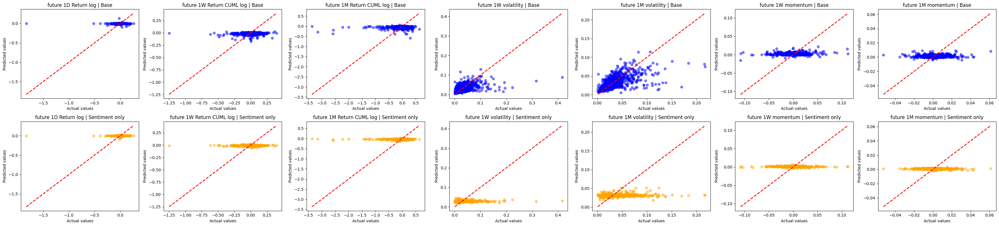

In [26]:
import matplotlib.pyplot as plt

targets = list(session_models.keys())
n_targets = len(targets)
model_types = ['base', 'sentiment-only']

fig, axes = plt.subplots(2, n_targets, figsize=(5 * n_targets, 8), squeeze=False)

for col_idx, target in enumerate(targets):
    y_test = test_set[target]
    for row_idx, model_type in enumerate(model_types):
        ax = axes[row_idx][col_idx]
        model = session_models[target][model_type]["model"]
        if model_type == "base":
            X_test = test_set[past_features]
        else:
            X_test = test_set[sentiment_features]
        y_pred = model.predict(X_test)
        ax.scatter(y_test, y_pred, alpha=0.5, color='blue' if model_type == 'base' else 'orange')
        ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
        ax.set_xlabel('Actual values')
        ax.set_ylabel('Predicted values')
        ax.set_title(f"{target.replace('_', ' ')} | {model_type.replace('-', ' ').capitalize()}")

plt.tight_layout()
plt.show()

We see that the *base* models are predictive only for the `volatility` target. Meanwhile, *sentiment* models offer no predictive effect over the future targets.

Next, we check the performance metrics of each of the model, so that to get a comprehensive picture.

In [27]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error

metrics_dict = {}

for target in session_models.keys():
    y_test = test_set[target]
    metrics_dict[target] = {}
    for model_type in ['base', 'sentiment-only']:
        model = session_models[target][model_type]['model']
        X_test = test_set[past_features] if model_type == "base" else test_set[sentiment_features]
        y_pred = model.predict(X_test)
        mae = mean_absolute_error(y_test, y_pred)
        mse = mean_squared_error(y_test, y_pred)
        rmse = mse ** 0.5
        r2 = r2_score(y_test, y_pred)
        mape = mean_absolute_percentage_error(y_test, y_pred)
        metrics_dict[target][model_type] = {
            'MAE': mae,
            'MSE': mse,
            'RMSE': rmse,
            'R2': r2,
            'MAPE': mape
        }

In [28]:
import pandas as pd

# Flatten the metrics_dict to a list of rows for DataFrame
rows = []
for target, model_results in metrics_dict.items():
    for model_type, metrics in model_results.items():
        row = {'Target': target, 'Model Type': model_type}
        row.update(metrics)
        rows.append(row)

df_metrics = pd.DataFrame(rows)

# Optional: pivot for model types as columns if you want side-by-side comparison per target
pivot_df = df_metrics.pivot(index='Target', columns='Model Type')
print("Metrics per Target and Model Type:\n")
print(df_metrics)
print("\nPivoted (side-by-side) view:\n")
print(pivot_df)

Metrics per Target and Model Type:

                       Target      Model Type       MAE       MSE      RMSE  \
0        future_1D_Return_log            base  0.030978  0.006161  0.078492   
1        future_1D_Return_log  sentiment-only  0.031106  0.006097  0.078082   
2   future_1W_Return_CUML_log            base  0.063410  0.010749  0.103676   
3   future_1W_Return_CUML_log  sentiment-only  0.063740  0.010870  0.104258   
4   future_1M_Return_CUML_log            base  0.143166  0.085261  0.291995   
5   future_1M_Return_CUML_log  sentiment-only  0.143970  0.087498  0.295800   
6        future_1W_volatility            base  0.014816  0.000741  0.027220   
7        future_1W_volatility  sentiment-only  0.019513  0.001014  0.031844   
8        future_1M_volatility            base  0.012190  0.000412  0.020307   
9        future_1M_volatility  sentiment-only  0.017815  0.000678  0.026033   
10         future_1W_momentum            base  0.011884  0.000349  0.018689   
11         futur